# Stability calculations

## -- LUVOIR --

In notebook 10, we calculated the PASTIS modes for all three currently designed apodizers for the LUVOIR A pupil. In this notebook, we will load the modes and calculate the maximum mode contributions $\sigma$ and strability requirements $\Delta \sigma$.

After that I also calculate the maximum segment contributions $\mu$.

In [1]:
# Imports
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
%matplotlib inline
from astropy.io import fits
import astropy.units as u
import hcipy as hc

os.chdir('../../pastis/')
import util_pastis as util
from e2e_simulators.luvoir_imaging_new import LuvoirAPLC

In [2]:
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Computer Modern Sans"]
plt.rcParams["text.usetex"] = True
plt.rcParams["text.latex.preamble"] = r"\usepackage{cmbright}"
plt.rcParams['font.size'] = 16
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['legend.fontsize'] = 16
plt.rcParams['figure.titlesize'] = 16

## Instantiate a simple SM for mode plotting

I need to simplify this... I can make a child class like I did for the full LUVOIR simulator.

In [3]:
# Load aperture files needed for SM
nseg = 120
wvln = 638e-9

datadir = '/Users/pueyo/PythonPackages/PASTIS/LUVOIR_delivery_May2019/'
aper_path = 'inputs/TelAp_LUVOIR_gap_pad01_bw_ovsamp04_N1000.fits'
aper_ind_path = 'inputs/TelAp_LUVOIR_gap_pad01_bw_ovsamp04_N1000_indexed.fits'
aper_read = hc.read_fits(os.path.join(datadir, aper_path))
aper_ind_read = hc.read_fits(os.path.join(datadir, aper_ind_path))

pupil_grid = hc.make_pupil_grid(dims=aper_ind_read.shape[0], diameter=15)
aper = hc.Field(aper_read.ravel(), pupil_grid)
aper_ind = hc.Field(aper_ind_read.ravel(), pupil_grid)

wf_aper = hc.Wavefront(aper, wvln)

# Load segment positions from fits header
hdr = fits.getheader(os.path.join(datadir, aper_ind_path))

poslist = []
for i in range(nseg):
    segname = 'SEG' + str(i+1)
    xin = hdr[segname + '_X']
    yin = hdr[segname + '_Y']
    poslist.append((xin, yin))
    
poslist = np.transpose(np.array(poslist))
seg_pos = hc.CartesianGrid(hc.UnstructuredCoords(poslist))

## Mode and eigenvalue units

Since the matrices got generated normalized to an aberration of 1 nm, everything stemming from the matrix will be in units of **nanometers**. --> This is the desired behaviour of course and is yet to be confirmed, which is one of the goals of this notebook.

In [4]:
eunit = 1e-9

## Also instantiate a LUVOR telescope

For cumulative contrast calculation.

> **ATTENTION:** the variable `apodizer_design` has to be correct for the data we are reading with the variable `savedpath` further below!!!

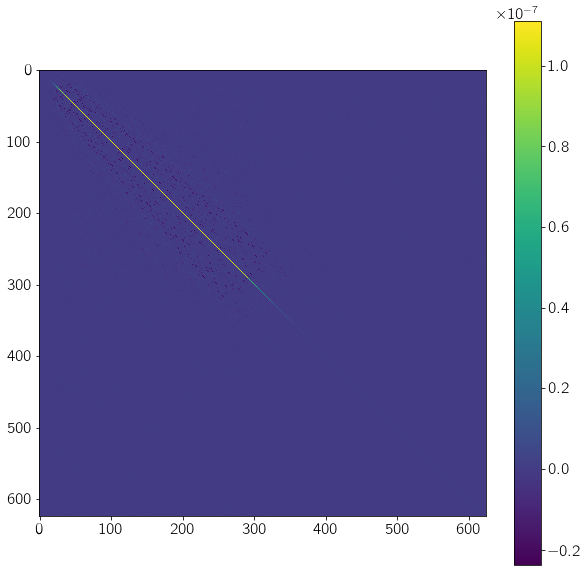

In [5]:
savedpath = '/Users/pueyo/Documents/data_from_repos/pastis_data/2020-08-10T19-58-29_luvoir-medium'   # large apodizer LUVOIR
matrix0 = fits.getdata(os.path.join(savedpath, 'matrix_numerical', 'PASTISmatrix_num_Multiple_Modes_HI_25.fits'))
matrix = matrix0[1:len(matrix0),1:len(matrix0)]
plt.figure(figsize=(10, 10))
plt.imshow(matrix)
plt.colorbar()

In [6]:
# Instantiate LUVOIR
sampling = 4
apodizer_design = 'medium'
# This path is specific to the paths used in the LuvoirAPLC class
optics_input = '/Users/pueyo/PythonPackages/PASTIS/LUVOIR_delivery_May2019/'
luvoir = LuvoirAPLC(optics_input, apodizer_design, sampling)

/Users/pueyo/anaconda3/envs/pastis-new-hcipy/lib/python3.7/site-packages/hcipy/field/cartesian_grid.py:68: UserWarning: No automatic weights could be calculated for this grid.
  self.weights *= np.abs(scale)**self.ndim


In [7]:
N_four = 25

In [8]:
luvoir.make_HI_Modes(N_four)

In [9]:
# jo = hc.make_pupil_grid(dims=N_four, diameter=N_four)
# mas =  hc.mode_basis.make_fourier_basis(luvoir.pupil_grid, jo, sort_by_energy=True)
# gru = hc.optics.DeformableMirror(mas)

In [10]:
# oh = mas.transformation_matrix
# ih = oh[:,2].reshape([1000,1000])
# plt.imshow(ih)

In [11]:
eunit = 1e-9

In [12]:
number_of_modes = luvoir.fdm.num_actuators
zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
zernike_coeffs[4] = 0
luvoir.fdm.actuators = zernike_coeffs
psf_unaber, ref, inter = luvoir.calc_psf(ref=True, return_intermediate='efield')
psf_unaber, ref = luvoir.calc_psf(ref=True)
norm = ref.max()
psf_unaber, ref, inter = luvoir.calc_psf(ref=True, return_intermediate='efield')
# wf_sm = gru(luvoir.wf_aper)
# psf_unaber, ref = luvoir.calc_psf(ref=True)
# norm = ref.max()

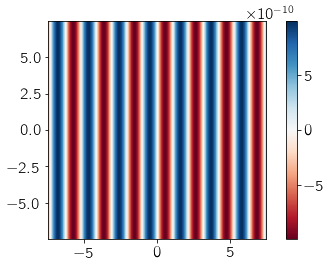

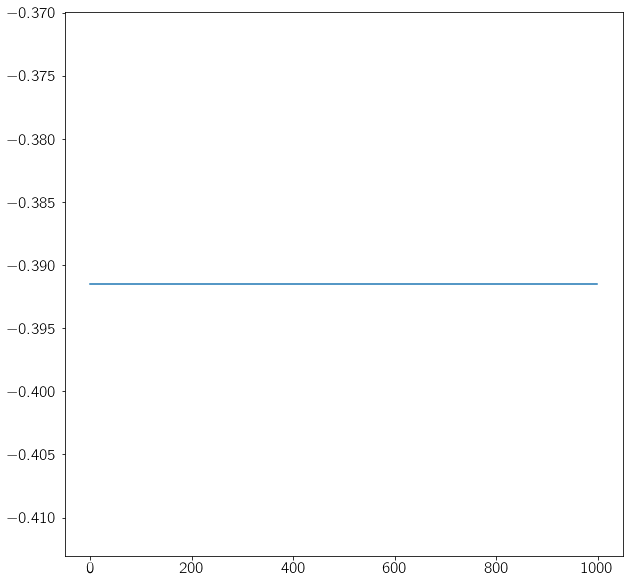

In [13]:
zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
zernike_coeffs[28] = 1e-9
luvoir.fdm.actuators = zernike_coeffs
wf_sm = luvoir.fdm(luvoir.wf_aper)
psf_abber, ref = luvoir.calc_psf(ref=True)
norm = ref.max()
test = luvoir.fdm.surface/np.sqrt(2)
fig, ax = plt.subplots(ncols=1)
img1 = hc.imshow_field(test,cmap='RdBu')#, vmin=pmin, vmax=pmax)
clb = fig.colorbar(img1)
# clb.set_label('mk', rotation=90)
plt.tight_layout(h_pad=1)
fion = np.real(test).reshape([1000,1000])/eunit
plt.figure(figsize=(10, 10))
plt.plot(fion[:,700])

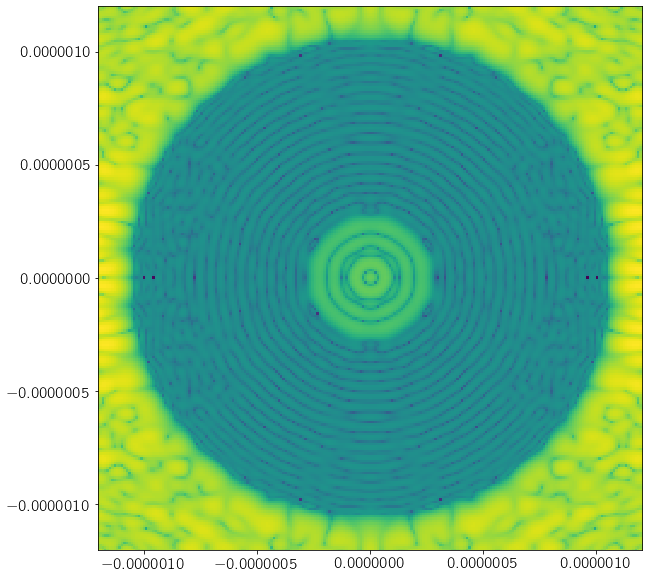

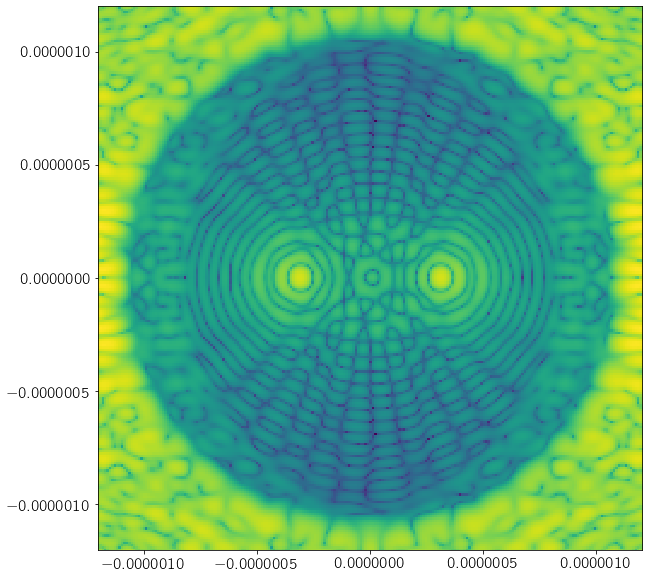

In [14]:
plt.figure(figsize=(10, 10))
hc.imshow_field(psf_unaber.intensity, norm=LogNorm())
plt.figure(figsize=(10, 10))
hc.imshow_field(psf_abber, norm=LogNorm())

In [15]:
# Make dark hole
dh_outer = hc.circular_aperture(2*luvoir.apod_dict[apodizer_design]['owa'] * luvoir.lam_over_d)(luvoir.focal_det)
dh_inner = hc.circular_aperture(2*luvoir.apod_dict[apodizer_design]['iwa'] * luvoir.lam_over_d)(luvoir.focal_det)
dh_mask = (dh_outer - dh_inner).astype('bool')

In [16]:
dh_intensity = psf_unaber.intensity/norm * dh_mask
baseline_contrast = np.mean(dh_intensity[np.where(dh_intensity != 0)])
print('contrast:', baseline_contrast)

contrast: 3.924822663883738e-11


## Read eigenmodes and eigenvalues

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


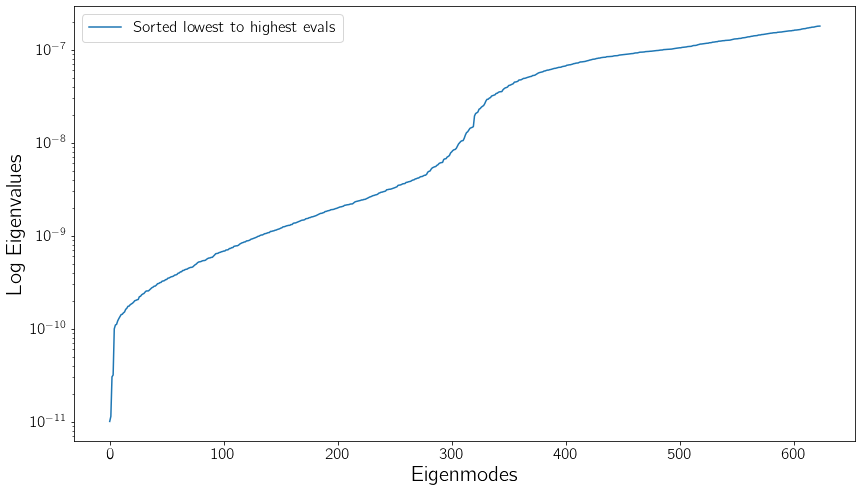

In [17]:
evals, evecs = np.linalg.eig(matrix)
sorted_evals = np.sort(evals)
sorted_indices = np.argsort(evals)
sorted_evecs = evecs[:, sorted_indices]
plt.figure(figsize=(14, 8))
#plt.plot(evals, label='Unsorted from eigendecomposition')
plt.plot(sorted_evals, label='Sorted lowest to highest evals')
plt.semilogy()
plt.xlabel('Eigenmodes')
plt.ylabel('Log Eigenvalues')
plt.legend()

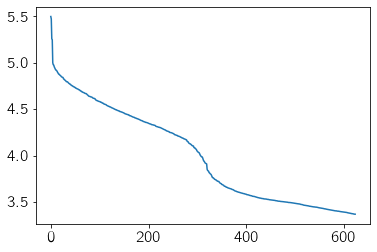

In [18]:
plt.plot(-0.5*np.log10(sorted_evals))

In [19]:
# Lets compute all modes now for LUVOIR with an HCIPy SM
emodes = []

for mode in range(len(evals)):
    print('Working on mode {}/{}.'.format(mode+1, len(evals)))
    zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
    zernike_coeffs[1:number_of_modes] = eunit*sorted_evecs[:, mode]/2
    luvoir.fdm.actuators = zernike_coeffs
    wf_sm = luvoir.fdm(luvoir.wf_aper)
    emodes.append(wf_sm.phase)

Working on mode 1/624.
Working on mode 2/624.
Working on mode 3/624.
Working on mode 4/624.
Working on mode 5/624.
Working on mode 6/624.
Working on mode 7/624.
Working on mode 8/624.
Working on mode 9/624.
Working on mode 10/624.
Working on mode 11/624.
Working on mode 12/624.
Working on mode 13/624.
Working on mode 14/624.
Working on mode 15/624.
Working on mode 16/624.
Working on mode 17/624.
Working on mode 18/624.
Working on mode 19/624.
Working on mode 20/624.
Working on mode 21/624.
Working on mode 22/624.
Working on mode 23/624.
Working on mode 24/624.
Working on mode 25/624.
Working on mode 26/624.
Working on mode 27/624.
Working on mode 28/624.
Working on mode 29/624.
Working on mode 30/624.
Working on mode 31/624.
Working on mode 32/624.
Working on mode 33/624.
Working on mode 34/624.
Working on mode 35/624.
Working on mode 36/624.
Working on mode 37/624.
Working on mode 38/624.
Working on mode 39/624.
Working on mode 40/624.
Working on mode 41/624.
Working on mode 42/624.
W

Working on mode 334/624.
Working on mode 335/624.
Working on mode 336/624.
Working on mode 337/624.
Working on mode 338/624.
Working on mode 339/624.
Working on mode 340/624.
Working on mode 341/624.
Working on mode 342/624.
Working on mode 343/624.
Working on mode 344/624.
Working on mode 345/624.
Working on mode 346/624.
Working on mode 347/624.
Working on mode 348/624.
Working on mode 349/624.
Working on mode 350/624.
Working on mode 351/624.
Working on mode 352/624.
Working on mode 353/624.
Working on mode 354/624.
Working on mode 355/624.
Working on mode 356/624.
Working on mode 357/624.
Working on mode 358/624.
Working on mode 359/624.
Working on mode 360/624.
Working on mode 361/624.
Working on mode 362/624.
Working on mode 363/624.
Working on mode 364/624.
Working on mode 365/624.
Working on mode 366/624.
Working on mode 367/624.
Working on mode 368/624.
Working on mode 369/624.
Working on mode 370/624.
Working on mode 371/624.
Working on mode 372/624.
Working on mode 373/624.


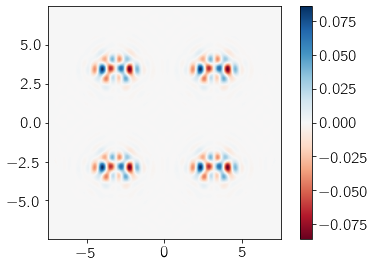

In [20]:
fig, ax = plt.subplots(ncols=1)
img1 = hc.imshow_field(emodes[623],cmap='RdBu')#, vmin=pmin, vmax=pmax)
clb = fig.colorbar(img1)
# clb.set_label('mk', rotation=90)
plt.tight_layout(h_pad=1)

contrast: 1.8473898779372405e-09


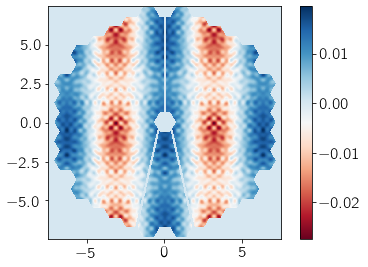

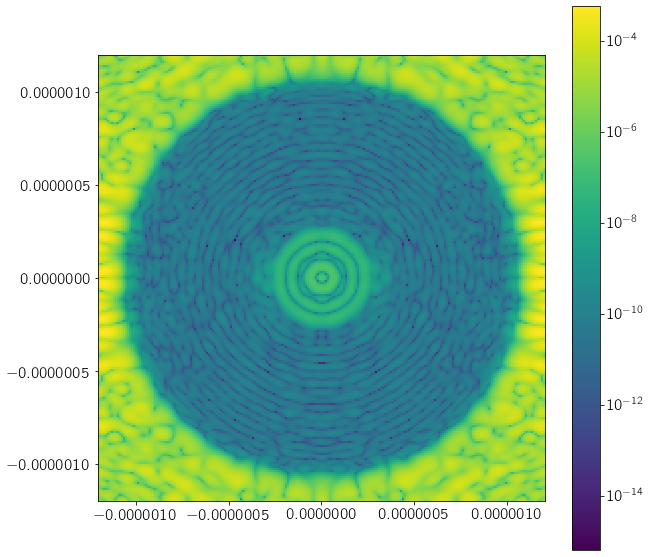

In [21]:
mode = 3
fig, ax = plt.subplots(ncols=1)
img1 = hc.imshow_field(emodes[mode],cmap='RdBu')#, vmin=pmin, vmax=pmax)
clb = fig.colorbar(img1)
# clb.set_label('mk', rotation=90)
plt.tight_layout(h_pad=1)
zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
zernike_coeffs[1:number_of_modes] = eunit*sorted_evecs[:, mode]/2
zernike_coeffs[0] = 0.
luvoir.fdm.actuators = zernike_coeffs
psf, ref, inter = luvoir.calc_psf(ref=True, return_intermediate='efield')
plt.figure(figsize=(10, 10))
hc.imshow_field(psf.intensity/norm, norm=LogNorm())
plt.colorbar()
dh_intensity = np.abs(psf.electric_field - psf_unaber.electric_field)**2/norm 
test_contrast = np.mean(dh_intensity[np.where(dh_intensity != 0)])
print('contrast:', test_contrast)

## Segment based constraints

In [22]:
plt.rcParams['font.family'] = "sans-serif"
plt.rcParams["font.sans-serif"] = ["Computer Modern Sans"]
plt.rcParams["text.usetex"] = True
plt.rcParams["text.latex.preamble"] = r"\usepackage{cmbright}"
plt.rcParams['font.size'] = 16
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['legend.fontsize'] = 16
plt.rcParams['figure.titlesize'] = 16

In [23]:
c_target = 1e-10

In [24]:
number_of_modes = luvoir.fdm.num_actuators
# Calculate the inverse of the pastis MODE matrix
modestosegs = np.linalg.pinv(sorted_evecs)

# # Calculate all mean contrasts of the pastis modes directly (as-is, with natural normalization)
# c_avg = []
# for i in range(number_of_modes):
#     c_avg.append(util.pastis_contrast(sorted_evecs[:, i] * u.nm, matrix) + baseline_contrast)

# # Calculate segment requirements
# mu_map = np.sqrt(
#     ((c_target - baseline_contrast) / number_of_modes) / (np.dot(c_avg - baseline_contrast, np.square(modestosegs))))

# Calculate all mean contrasts of the pastis modes directly (as-is, with natural normalization)
c_avg = []
for i in range(number_of_modes-1):
    c_avg.append(util.pastis_contrast(sorted_evecs[:, i] * u.nm, matrix) )

# Calculate segment requirements
mu_map = np.sqrt(
    ((c_target ) / (number_of_modes-1)) / (np.dot(c_avg, np.square(modestosegs))))

In [25]:
zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
luvoir.fdm.actuators = zernike_coeffs
wf_sm = luvoir.fdm(luvoir.wf_aper)
psf_unaber, ref, inter_unaber = luvoir.calc_psf(ref=True, return_intermediate='efield')

contrast: 3.959445132717847e-10


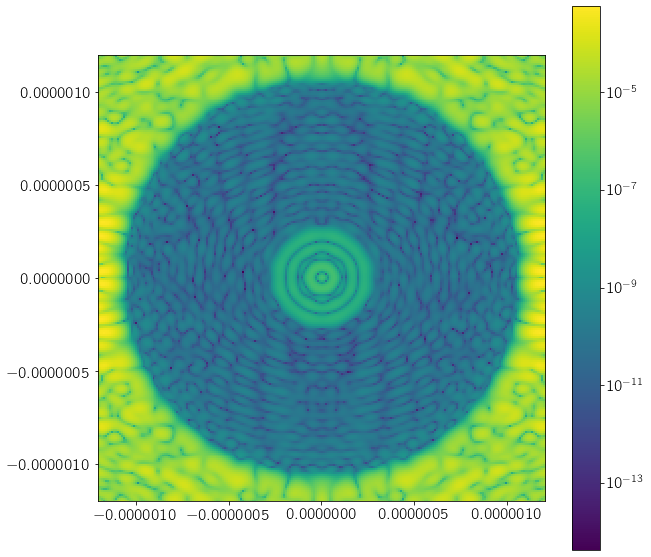

In [26]:
zernike_coeffs[1:number_of_modes] = mu_map*eunit/2
luvoir.fdm.actuators = zernike_coeffs
luvoir.fdm(luvoir.wf_aper)
psf, ref, inter = luvoir.calc_psf(ref=True, return_intermediate='efield')
plt.figure(figsize=(10, 10))
hc.imshow_field(psf.intensity/norm, norm=LogNorm())
plt.colorbar()
dh_intensity = np.abs(psf.electric_field - psf_unaber.electric_field)**2/norm 
test_contrast = np.mean(dh_intensity[np.where(dh_intensity != 0)])
print('contrast:', test_contrast)

In [27]:
# N_zernike = 5
# zernike_coeffs_numaps_Drifts = np.zeros([N_zernike,120])
# for qq in range(N_zernike):
#     zernike_coeffs_tmp = np.zeros([120])
#     for pp in range(120):
#         zernike_coeffs_tmp[pp] = mu_map[qq+(pp)*N_zernike]
#     zernike_coeffs_numaps_Drifts[qq] = zernike_coeffs_tmp

In [28]:
# N_zernike = 5
# zernike_coeffs_numaps = np.zeros([N_zernike,number_of_modes])
# for qq in range(N_zernike):
#     zernike_coeffs_tmp = np.zeros([number_of_modes])
#     for pp in range(120):
#         zernike_coeffs_tmp[qq+(pp)*N_zernike] = mu_map[qq+(pp)*N_zernike]
#     zernike_coeffs_numaps[qq] = zernike_coeffs_tmp

In [29]:
# # Instantiate LUVOIR
# sampling = 4
# apodizer_design = 'medium'
# # This path is specific to the paths used in the LuvoirAPLC class
# optics_input = '/Users/pueyo/PythonPackages/PASTIS/LUVOIR_delivery_May2019/'
# luvoirDUMMY = LuvoirAPLC(optics_input, apodizer_design, sampling)
# luvoirDUMMY.make_segment_zernike_primary(1)

In [30]:
fourier_grid = hc.make_pupil_grid(dims=N_four, diameter=N_four)
rho0 = np.sqrt(fourier_grid.x**2+fourier_grid.y**2)
rho = np.sort(rho0[1:len(rho0)])

In [31]:
rho0 = np.sqrt(fourier_grid.x**2+fourier_grid.y**2)
rho = np.sort(rho0[1:len(rho0)])

In [32]:
len(rho)

624

In [33]:
len(np.log10(mu_map*eunit))

624

In [34]:
plt.plot?

No handles with labels found to put in legend.


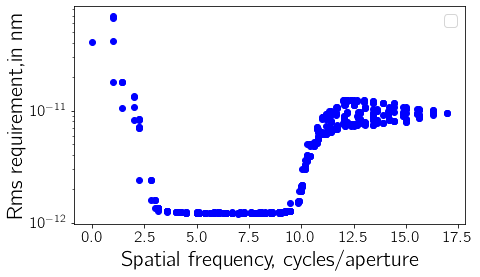

In [35]:
plt.figure(figsize=(7, 4))
#plt.plot(evals, label='Unsorted from eigendecomposition')
plt.plot(rho,mu_map*eunit,'bo')
plt.semilogy()
plt.xlabel('Spatial frequency, cycles/aperture')
plt.ylabel('Rms requirement,in nm')
plt.legend()

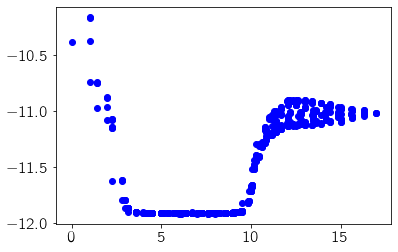

In [36]:
plt.plot(rho,np.log10(mu_map*eunit),'bo')

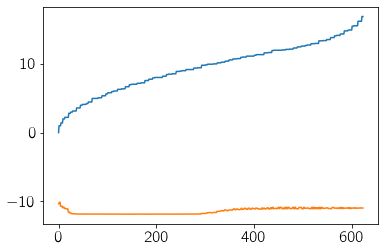

In [37]:
plt.plot(np.transpose([rho,np.log10(mu_map*eunit)]))

contrast: 8.174307756907463e-12


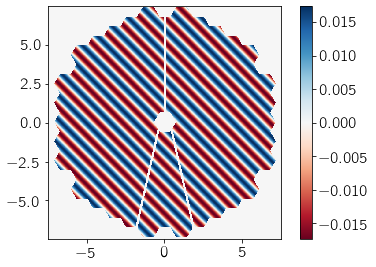

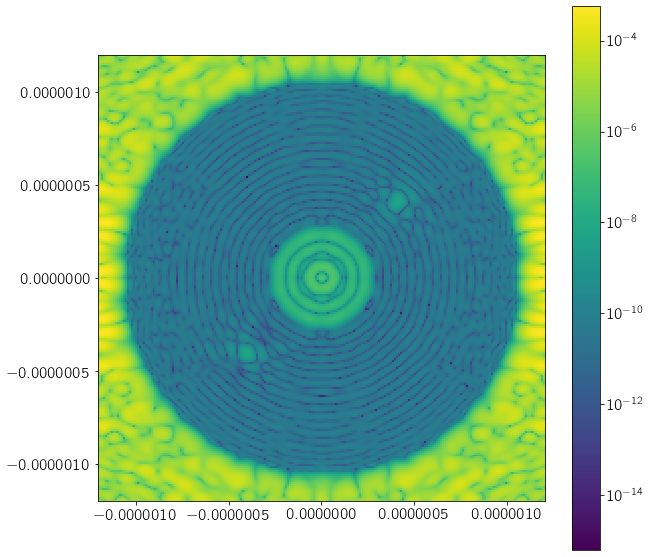

In [38]:
pp = 100
test = mu_map*eunit/2
zernike_coeffs = np.zeros([number_of_modes])
zernike_coeffs[pp] = test[pp]*10
luvoir.fdm.actuators = zernike_coeffs
wf_fdm = luvoir.fdm(luvoir.wf_aper)
luvoir.fdm(luvoir.wf_aper)
fig, ax = plt.subplots(ncols=1)
img1 = hc.imshow_field(wf_fdm.phase/luvoir.wf_aper.wavenumber*1e9,cmap='RdBu')#, vmin=pmin, vmax=pmax)
clb = fig.colorbar(img1)
# clb.set_label('mk', rotation=90)
plt.tight_layout(h_pad=1)
psf, ref, inter = luvoir.calc_psf(ref=True, return_intermediate='efield')
plt.figure(figsize=(10, 10))
hc.imshow_field(psf.intensity/norm, norm=LogNorm())
plt.colorbar()
dh_intensity = np.abs(psf.electric_field - psf_unaber.electric_field)**2/norm 
test_contrast = np.mean(dh_intensity[np.where(dh_intensity != 0)])
print('contrast:', test_contrast)

In [39]:
zernike_coeffs[1:number_of_modes] = mu_map*eunit/2
luvoir.fdm.actuators = zernike_coeffs
trou = luvoir.fdm(luvoir.wf_aper).phase/luvoir.wf_aper.wavenumber
# nu_maps.append(luvoir.fdm(luvoir.wf_aper).phase/luvoir.wf_aper.wavenumber)

Text(0.5, 1, 'Segment')

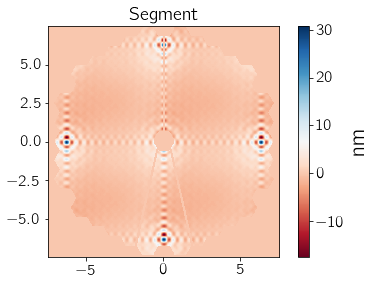

In [40]:
fig, ax = plt.subplots(ncols=1)
img1 = hc.imshow_field(trou*10e9, cmap='RdBu')#, vmin=pmin, vmax=pmax)
clb = fig.colorbar(img1)
clb.set_label('nm', rotation=90)
plt.tight_layout(h_pad=1)
plt.title('Segment')

In [41]:
# nu_maps_Drifts = []
# for qq in range(N_zernike):
#     zernike_coeffs = eunit*zernike_coeffs_numaps_Drifts[qq]/2
#     luvoirDUMMY.sm.actuators = zernike_coeffs
#     nu_maps_Drifts.append(luvoirDUMMY.sm(luvoirDUMMY.wf_aper).phase/luvoirDUMMY.wf_aper.wavenumber/eunit)

# E2E histogram

Segment realization 1/100
contrast: 1.4066476928926575e-10
Segment realization 2/100
contrast: 1.4764519743119241e-10
Segment realization 3/100
contrast: 1.5164670330569406e-10
Segment realization 4/100
contrast: 1.4675876592512433e-10
Segment realization 5/100
contrast: 1.5245591286644202e-10
Segment realization 6/100
contrast: 1.5103010715219362e-10
Segment realization 7/100
contrast: 1.4367004283672756e-10
Segment realization 8/100
contrast: 1.4672882686486678e-10
Segment realization 9/100
contrast: 1.4380072332624887e-10
Segment realization 10/100
contrast: 1.494616885675268e-10
Segment realization 11/100
contrast: 1.592102499808704e-10
Segment realization 12/100
contrast: 1.369324647003326e-10
Segment realization 13/100
contrast: 1.55897914650772e-10
Segment realization 14/100
contrast: 1.4785438343024067e-10
Segment realization 15/100
contrast: 1.418847026934056e-10
Segment realization 16/100
contrast: 1.5637235261130947e-10
Segment realization 17/100
contrast: 1.554044840421147e

/Users/pueyo/anaconda3/envs/pastis-new-hcipy/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


contrast: 1.54588433759683e-10
Segment realization 22/100
contrast: 1.4601562854163785e-10
Segment realization 23/100
contrast: 1.5658973644421256e-10
Segment realization 24/100
contrast: 1.3227986051582285e-10
Segment realization 25/100
contrast: 1.2372392100539942e-10
Segment realization 26/100
contrast: 1.6254243502314025e-10
Segment realization 27/100
contrast: 1.5801794641014947e-10
Segment realization 28/100
contrast: 1.534174327039605e-10
Segment realization 29/100
contrast: 1.593025800067364e-10
Segment realization 30/100
contrast: 1.470954070514078e-10
Segment realization 31/100
contrast: 1.5024076765027284e-10
Segment realization 32/100
contrast: 1.5008860733245803e-10
Segment realization 33/100
contrast: 1.50534067431328e-10
Segment realization 34/100
contrast: 1.4561796637664e-10
Segment realization 35/100
contrast: 1.6315557891627825e-10
Segment realization 36/100
contrast: 1.6676647534609803e-10
Segment realization 37/100
contrast: 1.4763750947673887e-10
Segment realizati

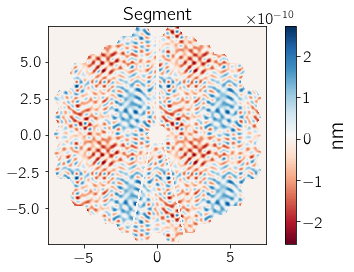

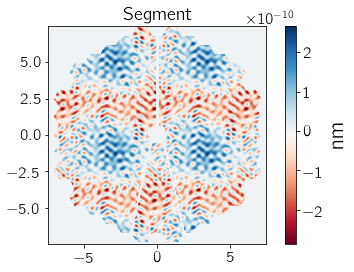

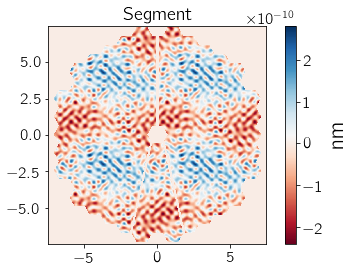

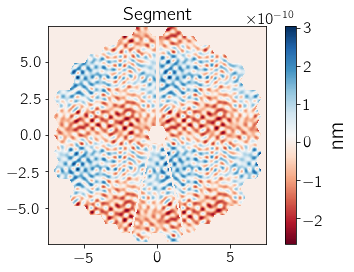

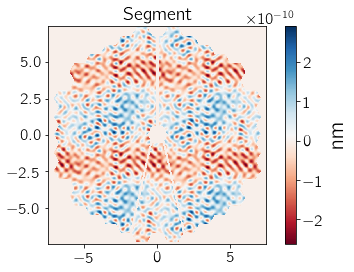

...

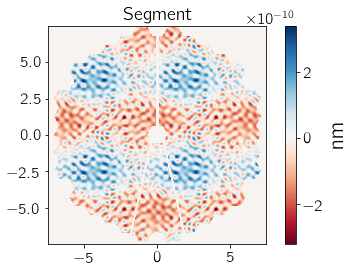

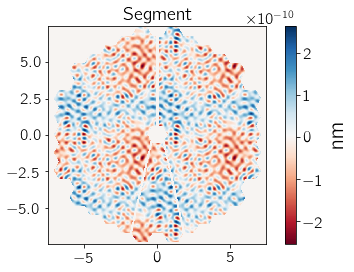

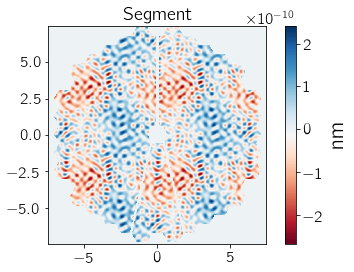

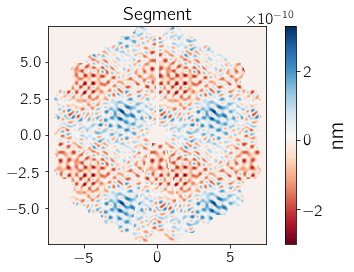

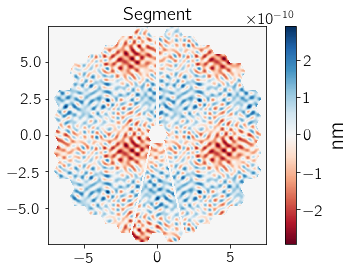

In [42]:
n_repeat = 100
all_contr_rand_seg = []
all_random_maps = []
for rep in range(n_repeat):
    print('Segment realization {}/{}'.format(rep + 1, n_repeat))
    #zernike_coeffs = np.random.uniform(-mu_map*eunit,mu_map*eunit,number_of_modes)
    zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
    zernike_coeffs[1:number_of_modes] = np.random.uniform(-mu_map*eunit/2,mu_map*eunit/2,number_of_modes-1)/np.sqrt(2)
    luvoir.fdm.actuators = zernike_coeffs
    luvoir.fdm(luvoir.wf_aper)
    trou = luvoir.fdm(luvoir.wf_aper).phase/luvoir.wf_aper.wavenumber
    fig, ax = plt.subplots(ncols=1)
    img1 = hc.imshow_field(trou, cmap='RdBu')#, vmin=pmin, vmax=pmax)
    clb = fig.colorbar(img1)
    clb.set_label('nm', rotation=90)
    plt.tight_layout(h_pad=1)
    plt.title('Segment')
    psf, ref, inter = luvoir.calc_psf(ref=True, return_intermediate='efield')
#     plt.figure(figsize=(10, 10))
#     hc.imshow_field(psf.intensity/norm, norm=LogNorm())
#     plt.colorbar()
    dh_intensity = np.abs(psf.electric_field - psf_unaber.electric_field)**2/norm 
    test_contrast = np.mean(dh_intensity[np.where(dh_intensity != 0)])
    all_contr_rand_seg.append(test_contrast) 
    print('contrast:', test_contrast)

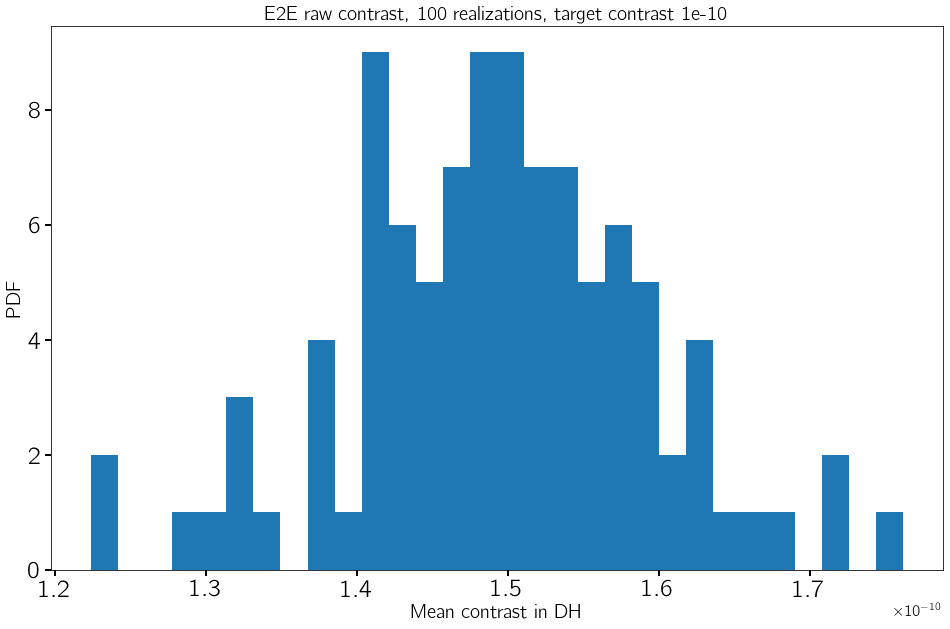

In [43]:
plt.figure(figsize=(16, 10))
plt.hist(all_contr_rand_seg,30)
plt.title('E2E raw contrast, {} realizations, target contrast 1e-10'.format(n_repeat), size=20)
plt.xlabel('Mean contrast in DH', size=20)
plt.ylabel('PDF', size=20)
plt.tick_params(axis='both', which='both', length=6, width=2, labelsize=25)

In [44]:
psf_test, ref, inter = luvoir.calc_psf(ref=True, return_intermediate='efield')

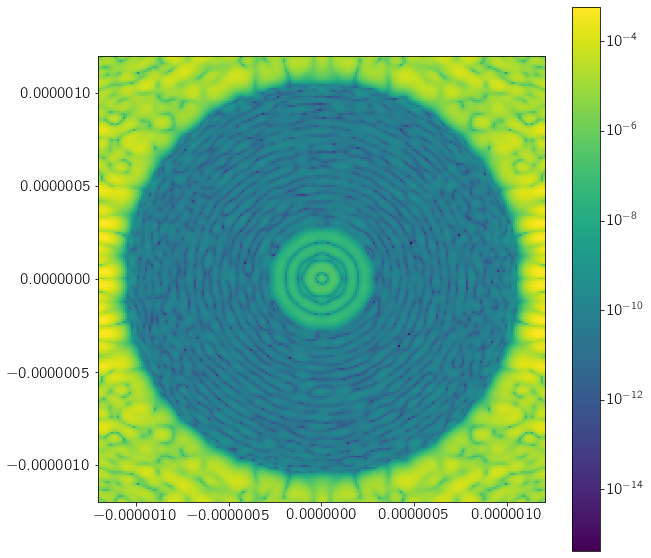

In [45]:
plt.figure(figsize=(10, 10))
hc.imshow_field(psf_test.intensity/norm, norm=LogNorm())
plt.colorbar()

In [46]:
z_step = np.pi/2
z_diam =1.06
z_np = 128
z_pup_diam = luvoir.diam
z_ref_wave = luvoir.wf_aper.wavelength

In [47]:
zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
zernike_coeffs[1:number_of_modes] = np.random.uniform(-mu_map*eunit/2,mu_map*eunit/2,number_of_modes-1)/np.sqrt(2)

In [48]:
luvoir.fdm.actuators = zernike_coeffs*100
chiotte = luvoir.fdm(luvoir.wf_aper)

In [49]:
grid_zernike =  hc.field.make_pupil_grid(100, diameter=15.)
zernike = hc.wavefront_sensing.ZernikeWavefrontSensorOptics(grid_zernike, phase_step=z_step, phase_dot_diameter=z_diam, num_pix=z_np, pupil_diameter=1/z_pup_diam, reference_wavelength=1/z_ref_wave)

In [50]:
number_of_modes = luvoir.fdm.num_actuators

In [51]:
E0_zernike_wfs = np.zeros([100*100,1,2])
zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
luvoir.fdm.actuators = zernike_coeffs
input_wf = luvoir.fdm(luvoir.wf_aper)
zernike_ref = zernike.forward(input_wf)
zernike_ref_sub_real = hc.field.subsample_field(zernike_ref.real,10,grid_zernike, statistic='mean')
zernike_ref_sub_imag = hc.field.subsample_field(zernike_ref.imag,10,grid_zernike, statistic='mean')
E0_zernike_wfs[:,0,0] = zernike_ref_sub_real
E0_zernike_wfs[:,0,1] = zernike_ref_sub_imag

In [52]:
pup_shape = luvoir.pupil_grid.shape

In [53]:
G_zernike_wfs = np.zeros([pup_shape[0]*pup_shape[1],number_of_modes])

In [54]:
G_zernike_wfs = np.zeros([100*100,2,number_of_modes])
for kk in range(0,number_of_modes):
    print(kk)
    zernike_coeffs = np.zeros([luvoir.fdm.num_actuators])
    zernike_coeffs[kk] = eunit
    luvoir.fdm.actuators = zernike_coeffs
    input_wf = luvoir.fdm(luvoir.wf_aper)
    zernike_int = zernike.forward(input_wf)
    zernike_int_sub_real = hc.field.subsample_field(zernike_int.real,10,grid_zernike, statistic='mean')
    zernike_int_sub_imag = hc.field.subsample_field(zernike_int.imag,10,grid_zernike, statistic='mean')
    G_zernike_wfs[:,0,kk] = zernike_int_sub_real
    G_zernike_wfs[:,1,kk] = zernike_int_sub_imag

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

So that is ok for the OBWFS, we need to do LOWFS

In [55]:
r = number_of_modes
N = 100*100
Q = np.eye(r)
c = 1
G = G_zernike_wfs
E0 = E0_zernike_wfs
flux = 1000
D = 0.00000000001
P = Q*0.0

In [56]:
G = G_zernike_wfs
E0 = E0_zernike_wfs

In [57]:
flux = 1000
D = 0.00000000001

In [58]:
P = Q*0.0

In [59]:
#all values are real
#G - sensitivity matrix of shape (N,2*c,r)
#N - number of pixels
#c - number of channels in one pixel (c=1) for monochromatic light or IFS
#r - number of modes
#Q - covariance of WFE modes (per exposure) of shape (r,r)
#E0 - static electric field of shape (N,1,2*c)
#flux - photon flux (per exposure) (see scaling of intensity at the bottom)
#D - dark current per pixel etc.

P = Q*0.0 #WFE modes covariance estimate
contrasts = []

#Iterations of ALGORITHM 1
contrast_hist = np.zeros(100)
cal_I_hist = np.zeros(100)
for pp in range(100):
    eps = np.random.multivariate_normal(np.zeros(r), P+Q).reshape((1,1,r)) #random modes
    G_eps = np.sum(G*eps, axis=2).reshape((N,1,2*c)) + E0 #electric field
#     G_eps = np.sum(G*eps, axis=2).reshape((N,1)) #electric field
    G_eps_squared = np.sum(G_eps*G_eps, axis=2, keepdims=True)
    G_eps_G = np.matmul(G_eps, G)
    G_eps_G_scaled = G_eps_G/np.sqrt(G_eps_squared + D/flux) #trick to save RAM

    cal_I = 4*flux*np.einsum("ijk,ijl->kl", G_eps_G_scaled, G_eps_G_scaled) #information matrix
    P = np.linalg.inv(np.linalg.inv(P+Q) + cal_I)

    intensity = G_eps_squared*flux + D
    contrasts.append(np.mean(intensity)/flux)
    contrast_hist[pp] = np.mean(intensity)/flux
    cal_I_hist[pp] = np.mean(cal_I)/flux
    print("est. contrast", np.mean(contrasts))

est. contrast 313.65310807376784
est. contrast 159.67254912431028
est. contrast 115.20992784611876
est. contrast 150.99413732590506
est. contrast 122.22350765473816
est. contrast 101.99432429806787
est. contrast 110.22278169783168
est. contrast 99.8718215226144
est. contrast 109.63201291894013
est. contrast 130.7927248492129
est. contrast 120.99077699195487
est. contrast 127.21459568181508
est. contrast 120.79753565874708
est. contrast 129.90293886316599
est. contrast 123.23220127130344
est. contrast 127.53419180098264
est. contrast 130.50409304645467
est. contrast 127.29874145448247
est. contrast 123.67264854632475
est. contrast 119.01215674329703
est. contrast 113.53557312645849
est. contrast 115.61939316234384
est. contrast 111.9455709321382
est. contrast 113.97616580152896
est. contrast 111.7516213302489
est. contrast 107.46232937766636
est. contrast 112.81808951616507
est. contrast 109.25726842474013
est. contrast 110.85864217652045
est. contrast 108.13233114677331
est. contrast 1

(array([58., 23.,  8.,  5.,  1.,  3.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([1.81098226e-01, 1.50884808e+02, 3.01588518e+02, 4.52292228e+02,
        6.02995938e+02, 7.53699648e+02, 9.04403358e+02, 1.05510707e+03,
        1.20581078e+03, 1.35651449e+03, 1.50721820e+03, 1.65792191e+03,
        1.80862562e+03, 1.95932933e+03, 2.11003304e+03, 2.26073675e+03,
        2.41144046e+03, 2.56214417e+03, 2.71284788e+03, 2.86355159e+03,
        3.01425530e+03]),
 <a list of 20 Patch objects>)

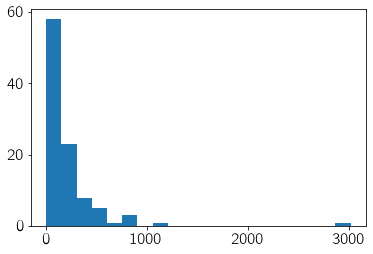

In [60]:
plt.hist(contrast_hist,20)

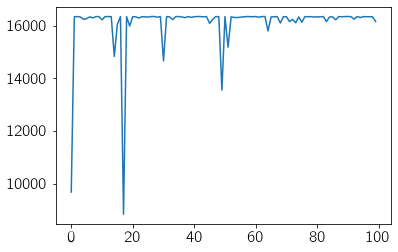

In [61]:
plt.plot(cal_I_hist)

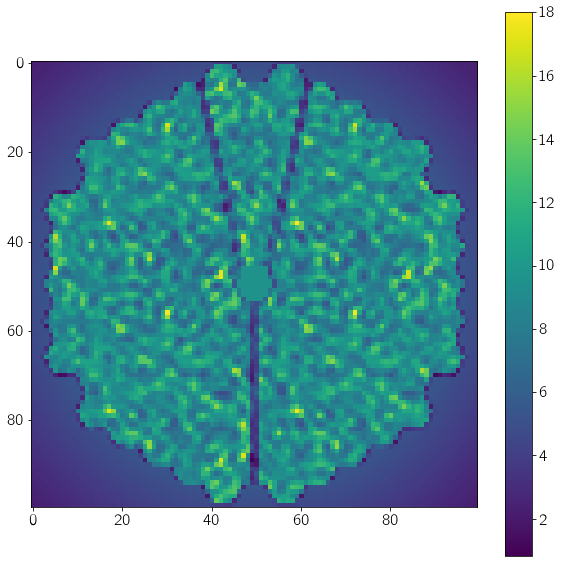

In [62]:
plt.figure(figsize=(10, 10))
plt.imshow(intensity.reshape([100,100])/flux)
plt.colorbar()

In [63]:
trou = G_eps*G_eps

In [64]:
G_eps.shape

(10000, 1, 2)

In [65]:
eps = np.random.multivariate_normal(np.zeros(r), P+Q).reshape((1,1,r)) #random modes


In [66]:
4e-11/1000

4e-14

In [67]:
4e-11/1000*1e12

0.04

In [68]:
1e-10/1200*1e12

0.08333333333333334

In [69]:
1/12

0.08333333333333333

In [71]:
2/0.04

50.0

In [1]:
0.2*4.8481368e-9*6 

5.817764160000001e-09

In [3]:
0.75*4.8481368e-9*6/2

1.0908307800000001e-08